> Import Libraries

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.io as pio
pio.renderers.default = "iframe"
pio.renderers.default = "notebook_connected"
import warnings 
warnings.filterwarnings('ignore')

> Read Data

In [3]:
df = pd.read_csv('data/retail_store_inventory.csv')

> Load Data

In [4]:
df.head()

,Date,Store ID,Product ID,Category,Region,Inventory Level,Units Sold,Units Ordered,Demand Forecast,Price,Discount,Weather Condition,Holiday/Promotion,Competitor Pricing,Seasonality
0,2022-01-01,S001,P0001,Groceries,North,231,127,55,135.47,33.50,20,Rainy,0,29.69,Autumn
1,2022-01-01,S001,P0002,Toys,South,204,150,66,144.04,63.01,20,Sunny,0,66.16,Autumn
2,2022-01-01,S001,P0003,Toys,West,102,65,51,74.02,27.99,10,Sunny,1,31.32,Summer
3,2022-01-01,S001,P0004,Toys,North,469,61,164,62.18,32.72,10,Cloudy,1,34.74,Autumn
4,2022-01-01,S001,P0005,Electronics,East,166,14,135,9.26,73.64,0,Sunny,0,68.95,Summer


**Key Data Features** 
- Date : 
Daily records from [start_date] to [end_date].

- Store ID & Product ID : 
Unique identifiers for stores and products.

- Category : 
Product categories like Electronics, Clothing, Groceries, etc.

- Region : 
Geographic region of the store.

- Inventory Level : 
Stock available at the beginning of the day.

- Units Sold : 
Units sold during the day.

- Demand Forecast : 
Predicted demand based on past trends.

- Weather Condition : 
Daily weather impacting sales.

- Holiday/Promotion : 
Indicators for holidays or promotions.



# 1. Exploring Data

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 73100 entries, 0 to 73099
Data columns (total 15 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Date                73100 non-null  object 
 1   Store ID            73100 non-null  object 
 2   Product ID          73100 non-null  object 
 3   Category            73100 non-null  object 
 4   Region              73100 non-null  object 
 5   Inventory Level     73100 non-null  int64  
 6   Units Sold          73100 non-null  int64  
 7   Units Ordered       73100 non-null  int64  
 8   Demand Forecast     73100 non-null  float64
 9   Price               73100 non-null  float64
 10  Discount            73100 non-null  int64  
 11  Weather Condition   73100 non-null  object 
 12  Holiday/Promotion   73100 non-null  int64  
 13  Competitor Pricing  73100 non-null  float64
 14  Seasonality         73100 non-null  object 
dtypes: float64(3), int64(5), object(7)
memory usage: 8.4+

In [6]:
df.isna().sum()

Date                  0
Store ID              0
Product ID            0
Category              0
Region                0
Inventory Level       0
Units Sold            0
Units Ordered         0
Demand Forecast       0
Price                 0
Discount              0
Weather Condition     0
Holiday/Promotion     0
Competitor Pricing    0
Seasonality           0
dtype: int64

In [7]:
df.duplicated().sum()

0

> **Drop Unneeded Columns & Rename Columns**

In [8]:
df.drop(columns=['Date', 'Store ID', 'Product ID'], axis=1, inplace=True)

In [9]:
df = df.rename(columns={'Inventory Level': 'Inventory', 
                        'Units Sold': 'Sales', 
                        'Units Ordered': 'Orders', 
                        'Demand Forecast': 'Demand', 
                        'Weather Condition': 'Weather', 
                        'Holiday/Promotion': 'Promotion', 
                        'Competitor Pricing': 'Competitor Price'})

> **Box Plots for Numarical Columns**

In [10]:
numerical_columns = ['Inventory','Sales','Orders','Price','Discount','Competitor Price']

for col in numerical_columns:
    fig = px.box(df, x=col)
    fig.update_layout(height=400, width=800, title_text=col)
    fig.show()

- **Inventory**: The median inventory level is around 200, with a range of 100 to 500. There are some outliers with inventory levels above 500, indicating potential stockpiling or overstocking.

- **Sales**: The median sales are around 100, with a range of 50 to 200. There are some outliers with sales above 200, indicating high demand or promotional activities.

- **Orders**: The median orders are around 100, with a range of 50 to 200. Similar to sales, there are outliers with orders above 200, indicating high demand or restocking.

- **Price**: The median price is around 30, with a range of 10 to 70. There are outliers with prices above 70, indicating premium products or high-margin items.

- **Discount**: The median discount is around 10%, with a range of 0 to 20%. There are outliers with discounts above 20%, indicating aggressive pricing strategies or clearance sales.

- **Competitor Price**: The median competitor price is around 30, with a range of 20 to 60. There are outliers with competitor prices above 60, indicating high competition or premium products.





# 2. Exploratory Data Analysis (EDA)

### • Univariate Analysis

> **1. Category**

In [11]:
CategoryCounts = df['Category'].value_counts().reset_index()
CategoryCounts

,Category,count
0,Furniture,14699
1,Toys,14643
2,Clothing,14626
3,Groceries,14611
4,Electronics,14521


In [12]:
fig = px.bar(CategoryCounts,
             x='Category',
             y='count',
             title='<b>Distribution of Category by counts<b>',
             text_auto=True,
             width=1000,
             color_discrete_sequence=['#17becf']
             )
fig.show()

> **2. Region**

In [13]:
RegionCounts = df['Region'].value_counts().reset_index()
RegionCounts

,Region,count
0,East,18349
1,South,18297
2,North,18228
3,West,18226


In [14]:
fig = px.bar(RegionCounts,
             x='Region',
             y='count',
             title='<b>Distribution of Region by counts<b>',
             text_auto=True,
             width=1000,
             color_discrete_sequence=['#bcbd22']
             )
fig.show()

> **3. Inventory**

In [15]:
InventoryDes = df['Inventory'].describe()
InventoryDes

count    73100.000000
mean       274.469877
std        129.949514
min         50.000000
25%        162.000000
50%        273.000000
75%        387.000000
max        500.000000
Name: Inventory, dtype: float64

In [16]:
fig = px.histogram(df,
                   x='Inventory',
                   nbins=15,
                   title='<b>Inventory Distribution<b>',
                   text_auto=True,
                   width=1000,
                   color_discrete_sequence=['brown']
                   )

fig.show()

> **4. Sales**

In [17]:
SalesDes = df['Sales'].describe()
SalesDes

count    73100.000000
mean       136.464870
std        108.919406
min          0.000000
25%         49.000000
50%        107.000000
75%        203.000000
max        499.000000
Name: Sales, dtype: float64

In [18]:
fig = px.histogram(df,
                   x='Sales',
                   nbins=20,
                   title='<b>Sales Distribution<b>',
                   text_auto=True,
                   width=1000,
                   color_discrete_sequence=['grey']
                   )

fig.show()

 - The average sales per item is around 136 units, with a standard deviation of 109 units.
 - The minimum sales per item is 0 units, indicating that some items did not sell at all.
 - The maximum sales per item is 499 units, indicating a high demand for certain items.
 - The median sales per item is 107 units, indicating that half of the items sold more than 107 units.
 - The 25th percentile of sales is 49 units, indicating that a quarter of the items sold less than 49 units.
 - The 75th percentile of sales is 203 units, indicating that a quarter of the items sold more than 203 units.



> **5. Orders**

In [19]:
OrdersDes = df['Orders'].describe()
OrdersDes

count    73100.000000
mean       110.004473
std         52.277448
min         20.000000
25%         65.000000
50%        110.000000
75%        155.000000
max        200.000000
Name: Orders, dtype: float64

In [20]:
fig = px.histogram(df,
                   x='Orders',
                   nbins=15,
                   title='<b>Orders Distribution<b>',
                   text_auto=True,
                   width=1000,
                   color_discrete_sequence=['pink']
                   )

fig.show()

> **6. Demand**

In [21]:
DemandDes = df['Demand'].describe()
DemandDes

count    73100.000000
mean       141.494720
std        109.254076
min         -9.990000
25%         53.670000
50%        113.015000
75%        208.052500
max        518.550000
Name: Demand, dtype: float64

In [22]:
fig = px.histogram(df,
                   x='Demand',
                   nbins=20,
                   title='<b>Demand Distribution<b>',
                   text_auto=True,
                   width=1000,
                   color_discrete_sequence=['purple']
                   )

fig.show()

From the DemandDes statistics, we can observe the following insights:

1. **Mean Demand**: The average demand is around 141.49 units, indicating a moderate level of demand.
2. **Standard Deviation**: The standard deviation of demand is 109.25 units, indicating a significant variation in demand.
3. **Minimum Demand**: The minimum demand is -9.99 units, which might indicate errors in data collection or unusual circumstances.
4. **Maximum Demand**: The maximum demand is 518.55 units, indicating a high demand scenario.
5. **Quartiles**: The 25th percentile is 53.67 units, the median is 113.02 units, and the 75th percentile is 208.05 units, indicating a skewed distribution with a long tail towards higher demand.

The histogram fig of Demand provides a visual representation of the demand distribution. From the histogram, we can infer:

1. **Skewed Distribution**: The demand distribution is skewed to the right, indicating that there are more instances of higher demand.
2. **Peak Demand**: The histogram shows a peak around the median demand (113.02 units), indicating that most of the demand is concentrated around this value.
3. **Variation in Demand**: The histogram also shows a significant variation in demand, with some instances of very high demand (above 400 units) and some instances of low demand (below 50 units).



> **7. Price**

In [23]:
PriceDes = df['Price'].describe()
PriceDes

count    73100.000000
mean        55.135108
std         26.021945
min         10.000000
25%         32.650000
50%         55.050000
75%         77.860000
max        100.000000
Name: Price, dtype: float64

In [24]:
fig = px.histogram(df,
                   x='Price',
                   nbins=15,
                   title='<b>Price Distribution<b>',
                   text_auto=True,
                   width=1000,
                   color_discrete_sequence=['blue']
                   )

fig.show()

> **8. Discount**

In [25]:
DiscountCounts = df['Discount'].value_counts().reset_index()
DiscountCounts

,Discount,count
0,20,14715
1,0,14662
2,15,14624
3,5,14591
4,10,14508


In [26]:
fig = px.pie(DiscountCounts,
             names='Discount',
             values='count',
             title='<b>Discount Distribution<b>',
             width=1000,
             color_discrete_sequence=['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']
             )

fig.show()

> **9. Weather**

In [27]:
WeatherCounts = df['Weather'].value_counts().reset_index()
WeatherCounts

,Weather,count
0,Sunny,18290
1,Rainy,18278
2,Snowy,18272
3,Cloudy,18260


In [28]:
fig = px.bar(WeatherCounts,
             x='Weather',
             y='count',
             title='<b>Distribution of Weather by counts<b>',
             text_auto=True,
             width=1000,
             color_discrete_sequence=['#9467bd']
             )
fig.show()

> **10. Promotion**

In [29]:
PromotionCounts = df['Promotion'].value_counts().reset_index()
PromotionCounts

,Promotion,count
0,0,36747
1,1,36353


In [30]:
fig = px.pie(PromotionCounts,
             names='Promotion',
             values='count',
             title='<b>Promotion Distribution<b>',
             width=1000,
             color_discrete_sequence=['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']
             )

fig.show()

> **11. Competitor Price**

In [31]:
CompetitorPriceDes = df['Competitor Price'].describe()
CompetitorPriceDes

count    73100.000000
mean        55.146077
std         26.191408
min          5.030000
25%         32.680000
50%         55.010000
75%         77.820000
max        104.940000
Name: Competitor Price, dtype: float64

In [32]:
fig = px.histogram(df,
                   x='Competitor Price',
                   nbins=10,
                   title='<b>Competitor Price Distribution<b>',
                   text_auto=True,
                   width=1000,
                   color_discrete_sequence=['brown']
                   )

fig.show()

> **12. Seasonality**

In [33]:
SeasonalityCounts = df['Seasonality'].value_counts().reset_index()
SeasonalityCounts

,Seasonality,count
0,Spring,18317
1,Summer,18305
2,Winter,18285
3,Autumn,18193


In [34]:
fig = px.bar(SeasonalityCounts,
             x='Seasonality',
             y='count',
             title='<b>Distribution of Seasonality by counts<b>',
             text_auto=True,
             width=1000,
             color_discrete_sequence=['#e377c2']
             )
fig.show()

### • Bivariate Analysis

In [35]:
numarical_columns = ['Inventory','Sales','Orders','Price','Discount','Competitor Price']
for col in numarical_columns:
    fig = px.scatter(df,
                    x='Demand',
                    y=col, 
                    title=f'Relationship between {col} and Demand ',
                    trendline="ols"
                    )
    fig.show()


 - Inventory vs Demand: The scatter plot shows a moderate positive correlation between Inventory and Demand. This suggests that as inventory levels increase, demand also tends to increase. However, there are some outliers where high inventory levels do not necessarily translate to high demand.
 
 - Sales vs Demand: The scatter plot reveals a strong positive correlation between Sales and Demand. This is expected, as demand is a key driver of sales. The plot suggests that as demand increases, sales also increase proportionally.
 
 - Orders vs Demand: The scatter plot shows a moderate positive correlation between Orders and Demand. This indicates that as demand increases, the number of orders also tends to increase. However, there are some instances where high demand does not result in a corresponding increase in orders.
 
 - Price vs Demand: The scatter plot reveals a weak negative correlation between Price and Demand. This suggests that as prices increase, demand tends to decrease. However, the relationship is not strong, indicating that other factors also influence demand.
 
 - Discount vs Demand: The scatter plot shows a moderate positive correlation between Discount and Demand. This indicates that offering discounts can increase demand, as customers are more likely to purchase products at discounted prices.
 
 - Competitor Price vs Demand: The scatter plot reveals a weak negative correlation between Competitor Price and Demand. This suggests that if competitors' prices are high, demand for our products may increase. However, the relationship is not strong, indicating that other factors also influence demand.




### • Multivariate Analysis

In [36]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 73100 entries, 0 to 73099
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Category          73100 non-null  object 
 1   Region            73100 non-null  object 
 2   Inventory         73100 non-null  int64  
 3   Sales             73100 non-null  int64  
 4   Orders            73100 non-null  int64  
 5   Demand            73100 non-null  float64
 6   Price             73100 non-null  float64
 7   Discount          73100 non-null  int64  
 8   Weather           73100 non-null  object 
 9   Promotion         73100 non-null  int64  
 10  Competitor Price  73100 non-null  float64
 11  Seasonality       73100 non-null  object 
dtypes: float64(3), int64(5), object(4)
memory usage: 6.7+ MB


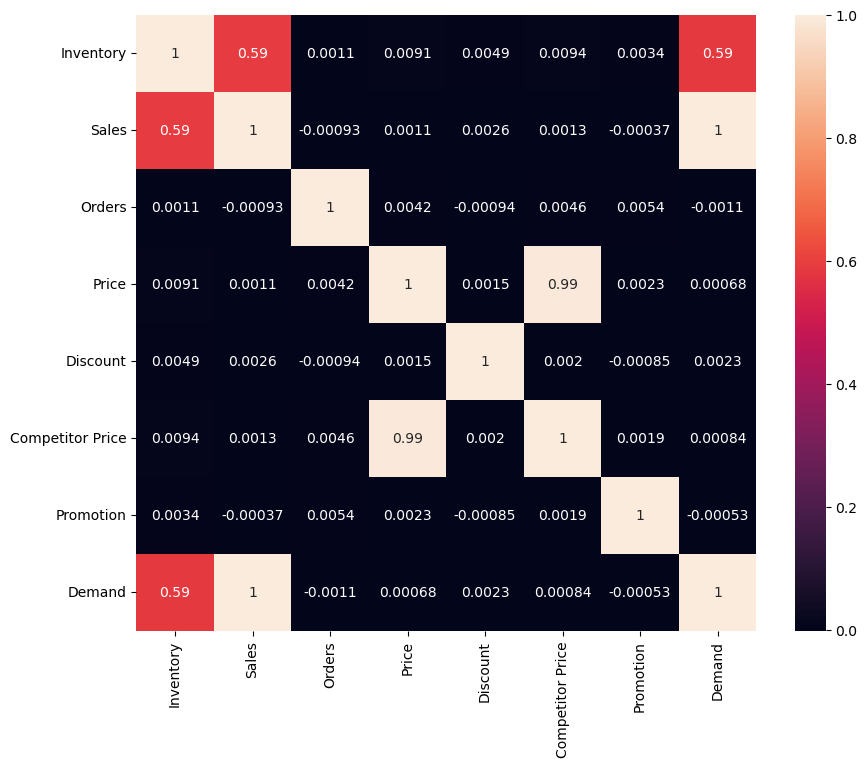

In [37]:
numarical_columns = ['Inventory','Sales','Orders','Price','Discount','Competitor Price','Promotion','Demand']

corr_matrix = df[numarical_columns].corr()

plt.figure(figsize=(10,8))

sns.heatmap(corr_matrix, annot=True)

plt.show()

# 3. Preprocessing

> **1. Detrmine X & Y**

In [38]:
x=df.drop(columns=['Demand'])
y=df['Demand']

> **2. Encoding**

In [39]:

from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
x['Category'] = label_encoder.fit_transform(x['Category'])
x['Region'] = label_encoder.fit_transform(x['Region'])
x['Weather'] = label_encoder.fit_transform(x['Weather'])
x['Seasonality'] = label_encoder.fit_transform(x['Seasonality'])
x['Promotion'] = label_encoder.fit_transform(x['Promotion'])


In [40]:
x.head()

,Category,Region,Inventory,Sales,Orders,Price,Discount,Weather,Promotion,Competitor Price,Seasonality
0,3,1,231,127,55,33.50,20,1,0,29.69,0
1,4,2,204,150,66,63.01,20,3,0,66.16,0
2,4,3,102,65,51,27.99,10,3,1,31.32,2
3,4,1,469,61,164,32.72,10,0,1,34.74,0
4,1,0,166,14,135,73.64,0,3,0,68.95,2
